In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from typing import Tuple, List


In [2]:
from typing import Tuple, List


import pandas as pd
from tqdm import tqdm
from glob import glob
from tensorflow import data as tfd
from tensorflow import image as tfi


import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import clear_output as cls

# Model Architecture
from tensorflow.keras import Sequential
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense

# Model Training
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report

# Model Hypertunning
!pip install -q keras_tuner
cls()
import keras_tuner as kt

In [3]:
# Constants
IMAGE_SIZE = 160 # size of the input image
BATCH_SIZE = 32 # number of samples per gradient update
EPOCHS = 50 # number of epochs to train the model

# Hyperparameters
LEARNING_RATE = 1e-3 # learning rate for the optimizer

# Specify the directory paths for the data
root_dir = "data/"

train_dir = f"{root_dir}train/" # path to the directory containing training data
# train_dir = f"train/" # path to the directory containing training data
valid_dir = f"{root_dir}valid/" # path to the directory containing validation data
# valid_dir = f"valid/" # path to the directory containing validation data
test_dir = f"{root_dir}test/" # path to the directory containing test data
# test_dir = f"test/" # path to the directory containing test data

# Model training
LOSS = 'sparse_categorical_crossentropy'
METRICS = ['accuracy']

random_seed = 42 # set random seed for reproducibility
tf.random.set_seed(random_seed) # set random seed for TensorFlow
np.random.seed(random_seed) # set random seed for NumPy

In [4]:
# Collect the class names
class_names = sorted(os.listdir(train_dir))
n_classes = len(class_names)

# Show
print(f"Total number of classes: {n_classes}")
print(f"Classes: {class_names}")

Total number of classes: 6
Classes: ['.ipynb_checkpoints', 'Apple', 'Banana', 'Grape', 'Mango', 'Strawberry']


In [5]:
def load_image(image_path: str) -> tf.Tensor:
    
   
    # Check if image path exists
    assert os.path.exists(image_path), f'Invalid image path: {image_path}'
    
    # Read the image file
    image = tf.io.read_file(image_path)

    # Load the image
    try:
        image = tfi.decode_jpeg(image, channels=3)
    except:
        image = tfi.decode_png(image, channels=3)
    
    # Change the image data type
    image = tfi.convert_image_dtype(image, tf.float32)
    
    # Resize the Image
    image = tfi.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
    
    # Convert image data type to tf.float32
    image = tf.cast(image, tf.float32)
    
    return image

In [6]:
# import matplotlib.pyplot as plt

# # Specify the path to the image you want to visualize
# image_path = "data/train/Apple/Apple (1).jpeg"

# # Load and preprocess the image
# image = load_image(image_path)

# # Display the original and preprocessed images
# fig, axes = plt.subplots(1, 2, figsize=(10, 5))
# axes[0].imshow(plt.imread(image_path))
# axes[0].set_title('Original Image')
# axes[0].axis('off')
# axes[1].imshow(image)
# axes[1].set_title('Preprocessed Image')
# axes[1].axis('off')

# plt.tight_layout()
# plt.show()


Original Image Shape: (147, 120, 3)
Preprocessed Image Shape: (224, 224, 3)


2023-05-22 00:33:42.809602: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/usr/local/nccl2/lib:/usr/local/cuda/extras/CUPTI/lib64
2023-05-22 00:33:42.809651: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-05-22 00:33:42.809683: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (umn-1684204425): /proc/driver/nvidia/version does not exist
2023-05-22 00:33:42.813189: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


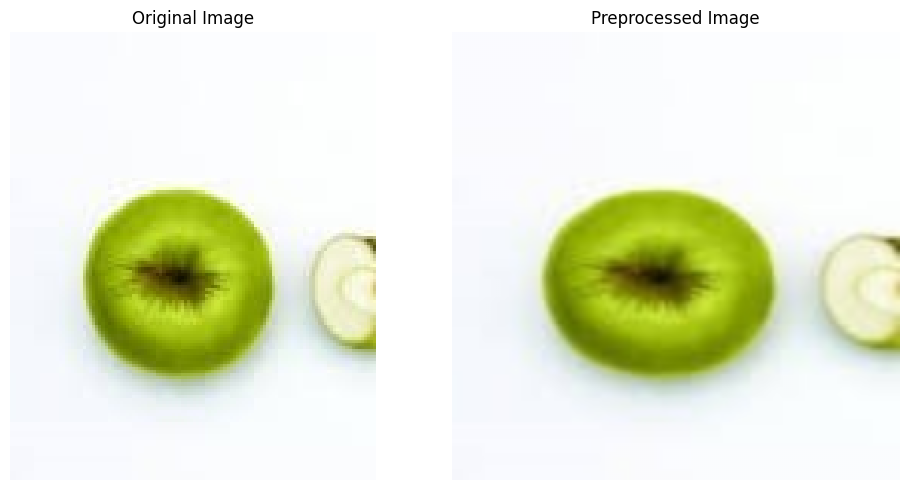

In [7]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.image as tfi

def preprocess_image(image_path):
    # Load the image
    image = plt.imread(image_path)
    
    # Display the original image shape
    print("Original Image Shape:", image.shape)
    
    # Preprocess the image
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    
    # Display the preprocessed image shape
    print("Preprocessed Image Shape:", image.shape)
    
    return image

# Specify the path to the image
image_path = "data/train/Apple/Apple (1).jpeg"

# Preprocess the image and get the preprocessed image tensor
preprocessed_image = preprocess_image(image_path)

# Display the original and preprocessed images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(plt.imread(image_path))
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()


In [8]:
#!pip install opencv-python


In [9]:
import os
import cv2
import numpy as np

def extract_color_histogram(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Extract color histogram features
    hist = cv2.calcHist([image], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()

    return hist

def apply_feature_engineering(directory):
    features = []
    labels = []

    # Iterate over each class folder
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)

        # Iterate over each image in the class folder
        for image_name in os.listdir(class_dir):
            image_path = os.path.join(class_dir, image_name)

            try:
                # Extract color histogram features from the image
                hist = extract_color_histogram(image_path)

                # Append the features and corresponding label
                features.append(hist)
                labels.append(class_name)
            except Exception as e:
                print(f"Error processing image: {image_path}")
                print(f"Error message: {str(e)}")
    
    return features, labels

# Apply feature engineering on the training set
train_features, train_labels = apply_feature_engineering(train_dir)

# Apply feature engineering on the validation set
valid_features, valid_labels = apply_feature_engineering(valid_dir)

# Apply feature engineering on the test set
test_features, test_labels = apply_feature_engineering(test_dir)

# Convert the feature lists to NumPy arrays
train_features = np.array(train_features)
valid_features = np.array(valid_features)
test_features = np.array(test_features)

# Print the shape of the feature vectors
print("Train Feature Vector Shape:", train_features.shape)
print("Valid Feature Vector Shape:", valid_features.shape)
print("Test Feature Vector Shape:", test_features.shape)


Error processing image: data/train/Apple/.ipynb_checkpoints
Error message: OpenCV(4.7.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Train Feature Vector Shape: (9700, 512)
Valid Feature Vector Shape: (200, 512)
Test Feature Vector Shape: (100, 512)


In [10]:
# import matplotlib.pyplot as plt

# # Assuming train_feature_vector contains the feature vectors
# # of the training set

# # Selecting an example feature vector from the training set
# example_feature_vector = train_features[2]

# # Plotting the color histograms
# plt.figure(figsize=(13,2))
# plt.bar(range(len(example_feature_vector)), example_feature_vector)
# plt.xlabel('Bin')
# plt.ylabel('Frequency')
# plt.title('Color Histogram - Example Image')
# plt.show()


In [11]:
# import matplotlib.pyplot as plt
# import numpy as np

# def visualize_feature_vectors(train_feature_vector, valid_feature_vector, test_feature_vector, save_path):
#     # Count the occurrences of each feature value for each dataset
#     train_feature_counts = np.sum(train_feature_vector, axis=0)
#     valid_feature_counts = np.sum(valid_feature_vector, axis=0)
#     test_feature_counts = np.sum(test_feature_vector, axis=0)

#     # Get the unique feature names
#     feature_names = np.arange(len(train_feature_counts))

#     # Set up the plot
#     plt.figure(figsize=(30, 26))
#     bar_width = 0.8
#     opacity = 0.8

#     # Plot the bars for each dataset
#     plt.bar(feature_names, train_feature_counts, bar_width, alpha=opacity, color='b', label='Train')
#     plt.bar(feature_names + bar_width, valid_feature_counts, bar_width, alpha=opacity, color='g', label='Valid')
#     plt.bar(feature_names + 2 * bar_width, test_feature_counts, bar_width, alpha=opacity, color='r', label='Test')

#     # Add labels and title
#     plt.xlabel('Feature Index')
#     plt.ylabel('Count')
#     plt.title('Distribution of Feature Values')
#     plt.xticks(feature_names + bar_width, feature_names)
#     plt.legend()

#     # Save the plot as an image
#     plt.savefig(save_path)

# # Assuming you have the following feature vectors:
# train_feature_vector = ...
# valid_feature_vector = ...
# test_feature_vector = ...

# # Specify the file path to save the plot
# save_path = 'feature_distribution.png'

# # Visualize the feature vectors and save the plot
# visualize_feature_vectors(train_features, valid_features, test_features, save_path)

# # Share the saved image file here


In [12]:
def load_dataset(root_path: str, class_names: list, trim: int=None) -> Tuple[np.ndarray, np.ndarray]:
   # numpy arrays, one containing the images and the other containing their respective labels.
   
    
    if trim:
        # Trim the size of the data
        n_samples = len(class_names) * trim
    else:
        # Collect total number of data samples
         n_samples = sum([len(os.listdir(os.path.join(root_path, name))) for name in class_names])

    # Create arrays to store images and labels
    images = np.empty(shape=(n_samples, IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.float32)
    labels = np.zeros((n_samples, 1), dtype=np.int32)
    
    # Loop over all the image file paths, load and store the images with respective labels
    n_image = 0
    for class_name in tqdm(class_names, desc="Loading"):
        class_path = os.path.join(root_path, class_name)
        image_paths = list(glob(os.path.join(class_path, "*")))[:trim]

        for file_path in image_paths:
            # Load the image
            image = load_image(file_path)

            # Assign label
            label = class_names.index(class_name)
            # print(label) 

            # Store the image and the respective label
            images[n_image] = image
            labels[n_image] = label

            # Increment the number of images processed
            n_image += 1

    # Shuffle the data
    indices = np.random.permutation(n_samples)
    images = images[indices]
    labels = labels[indices]

    return images, labels

In [13]:

# Load the training dataset 
X_train, y_train = load_dataset(root_path = train_dir, class_names = class_names, trim=1000)  # 1000 images per class


Loading: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]


In [14]:
 # Load the validation dataset
X_valid, y_valid = load_dataset(root_path = valid_dir, class_names = class_names)


Loading: 100%|██████████| 6/6 [00:00<00:00, 18.08it/s]


In [15]:
# Load the testing dataset
X_test, y_test = load_dataset(root_path = test_dir, class_names = class_names)

Loading: 100%|██████████| 6/6 [00:00<00:00, 35.11it/s]


In [14]:
# EDA 
class_dis = [len(os.listdir(train_dir + name)) for name in class_names]

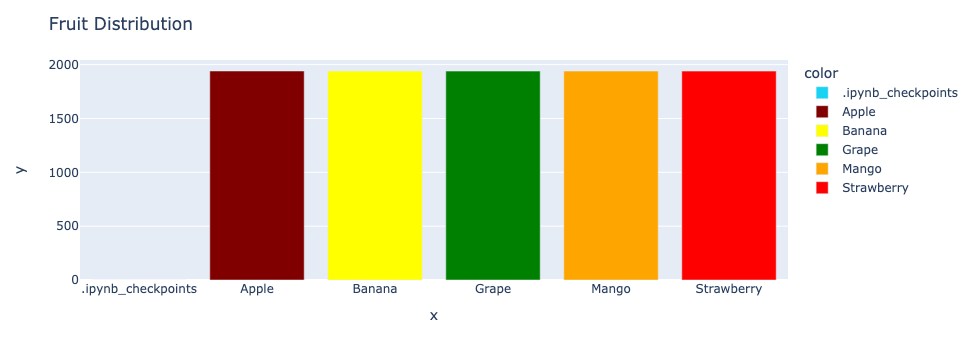

In [15]:
color_discrete_map = {
    'Apple': 'maroon',
    'Banana': 'yellow',
    'Grape': 'green',
    'Mango': 'orange',
    'Strawberry': 'red'
}

bar_chart = px.bar(x=class_names, y=class_dis, color=class_names, color_discrete_map=color_discrete_map)
bar_chart.update_layout(title="Fruit Distribution")
bar_chart.show()


In [16]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Specify the directory path for the fruit images
data_dir = "data/train/"
class_names = os.listdir(data_dir)

In [17]:
# Create empty arrays to store color channel values
red_values = []
green_values = []
blue_values = []


In [18]:
# Iterate over each class of fruits
for class_name in class_names:
    class_dir = os.path.join(data_dir, class_name)
    image_files = os.listdir(class_dir)

In [20]:
# Iterate over images in the current class
for image_file in image_files:
    image_path = os.path.join(class_dir, image_file)


In [21]:
 # Read the image
image = cv2.imread(image_path)


In [22]:
# Check if the image was successfully read
if image is not None:
            # Extract color channel values
    red_channel = image[:, :, 2]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 0]

# Append color channel values to respective arrays
    red_values.extend(red_channel.flatten())
    green_values.extend(green_channel.flatten())
    blue_values.extend(blue_channel.flatten())

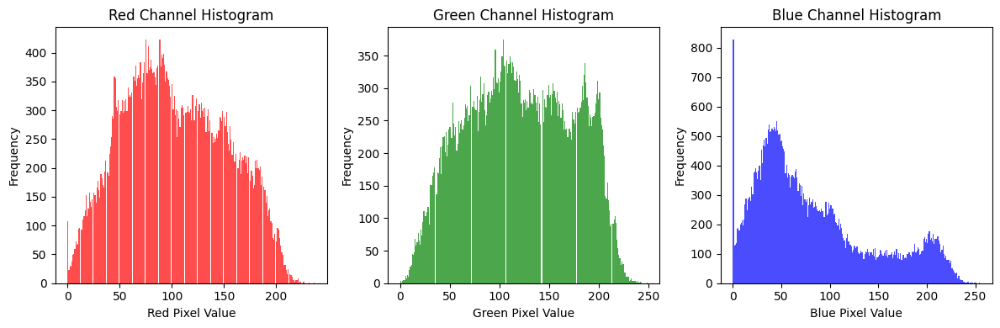

In [23]:
# Plot color histograms
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].hist(red_values, bins=256, color='red', alpha=0.7)
axs[0].set_xlabel('Red Pixel Value')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Red Channel Histogram')

axs[1].hist(green_values, bins=256, color='green', alpha=0.7)
axs[1].set_xlabel('Green Pixel Value')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Green Channel Histogram')

axs[2].hist(blue_values, bins=256, color='blue', alpha=0.7)
axs[2].set_xlabel('Blue Pixel Value')
axs[2].set_ylabel('Frequency')
axs[2].set_title('Blue Channel Histogram')

plt.tight_layout()
plt.show()


Overall Statistics
Mean: 145.35
Standard Deviation: 56.42
Minimum Pixel Value: 5.59
Maximum Pixel Value: 251.60


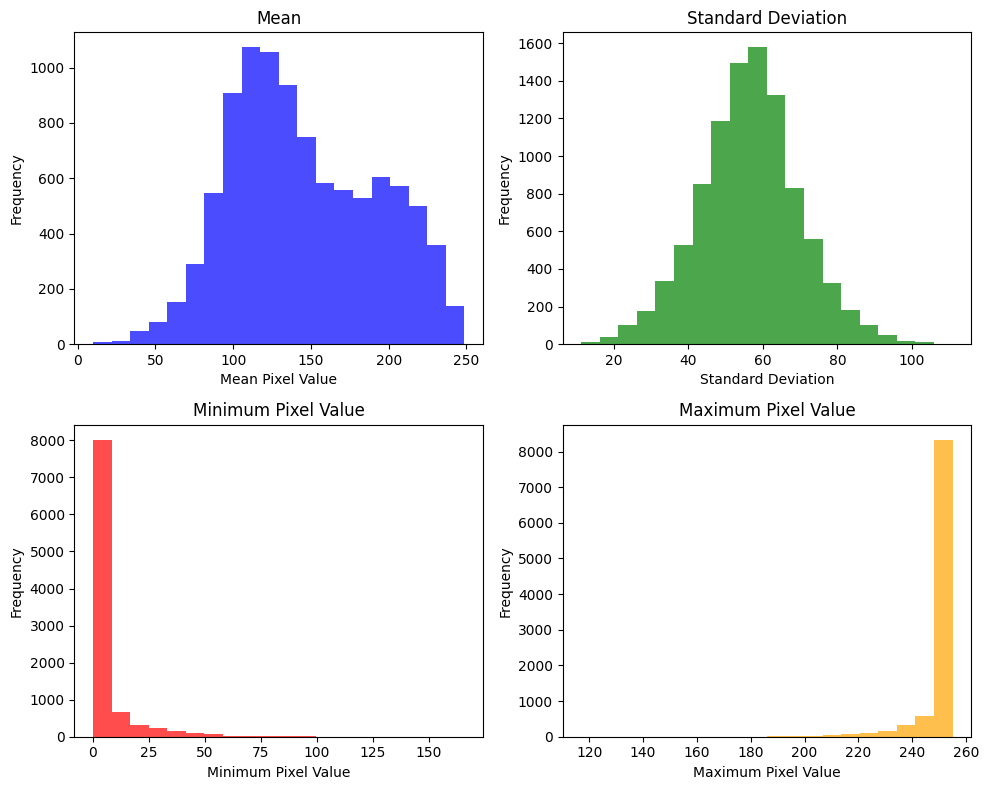

In [40]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Specify the directory path for the fruit images
data_dir = "data/train/"
class_names = os.listdir(data_dir)

# Create empty lists to store image statistics
means = []
stds = []
mins = []
maxs = []

# Iterate over each class of fruits
for class_name in class_names:
    class_dir = os.path.join(data_dir, class_name)
    image_files = os.listdir(class_dir)

    # Iterate over images in the current class
    for image_file in image_files:
        image_path = os.path.join(class_dir, image_file)

        # Read the image
        image = cv2.imread(image_path)

        if image is not None:
            # Convert the image to grayscale
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Compute image statistics
            mean = np.mean(gray_image)
            std = np.std(gray_image)
            min_value = np.min(gray_image)
            max_value = np.max(gray_image)

            # Store the statistics in the respective lists
            means.append(mean)
            stds.append(std)
            mins.append(min_value)
            maxs.append(max_value)

# Convert the lists to NumPy arrays
means = np.array(means)
stds = np.array(stds)
mins = np.array(mins)
maxs = np.array(maxs)

# Print the overall statistics
print("Overall Statistics")
print("Mean: {:.2f}".format(np.mean(means)))
print("Standard Deviation: {:.2f}".format(np.mean(stds)))
print("Minimum Pixel Value: {:.2f}".format(np.mean(mins)))
print("Maximum Pixel Value: {:.2f}".format(np.mean(maxs)))

# Plot histograms of the statistics
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

axs[0, 0].hist(means, bins=20, color='blue', alpha=0.7)
axs[0, 0].set_xlabel('Mean Pixel Value')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].set_title('Mean')

axs[0, 1].hist(stds, bins=20, color='green', alpha=0.7)
axs[0, 1].set_xlabel('Standard Deviation')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].set_title('Standard Deviation')

axs[1, 0].hist(mins, bins=20, color='red', alpha=0.7)
axs[1, 0].set_xlabel('Minimum Pixel Value')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].set_title('Minimum Pixel Value')

axs[1, 1].hist(maxs, bins=20, color='orange', alpha=0.7)
axs[1, 1].set_xlabel('Maximum Pixel Value')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].set_title('Maximum Pixel Value')

plt.tight_layout()
plt.show()


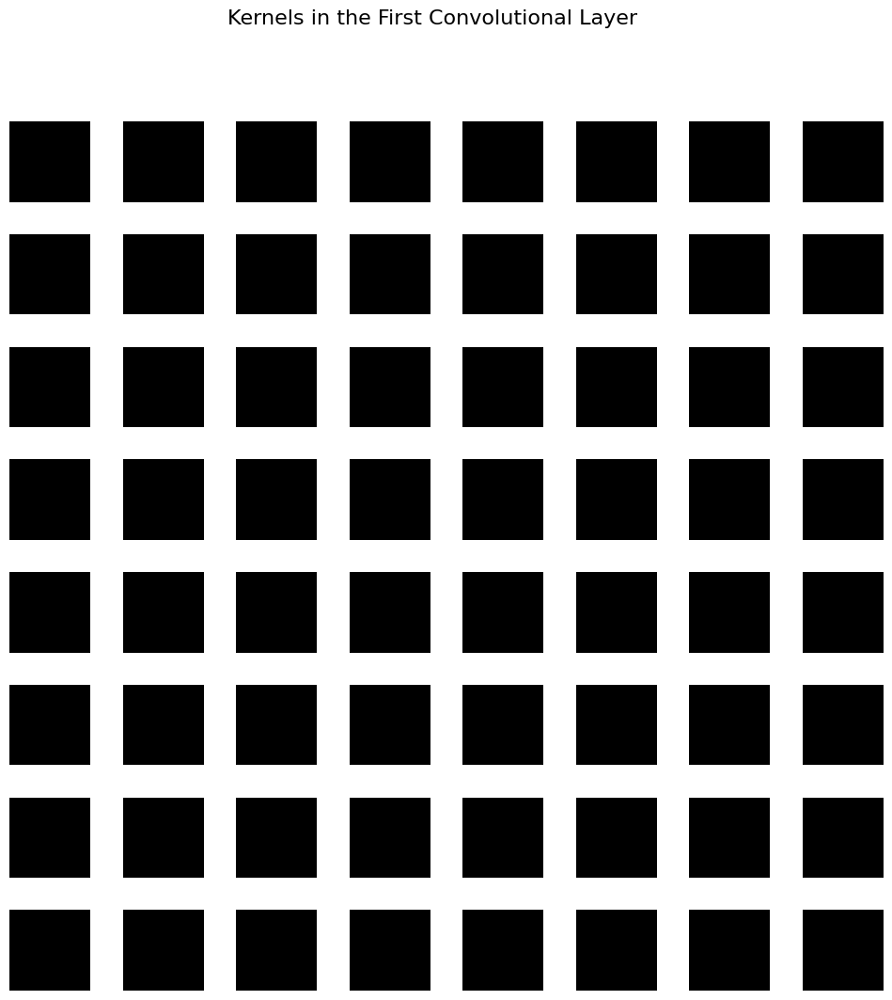

In [42]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
import matplotlib.pyplot as plt

# Load the MobileNetV2 model
model = MobileNetV2(include_top=False, weights='imagenet')

# Get the first convolutional layer
conv_layer = model.get_layer('block_1_expand')

# Get the kernel weights
kernel_weights = conv_layer.get_weights()[0]

# Plot the kernels
fig, axs = plt.subplots(8, 8, figsize=(12, 12))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(8):
    for j in range(8):
        kernel = kernel_weights[:, :, :, i*8 + j]
        axs[i, j].imshow(kernel[:, :, 0], cmap='gray')
        axs[i, j].axis('off')

plt.suptitle('Kernels in the First Convolutional Layer', fontsize=16)
plt.show()


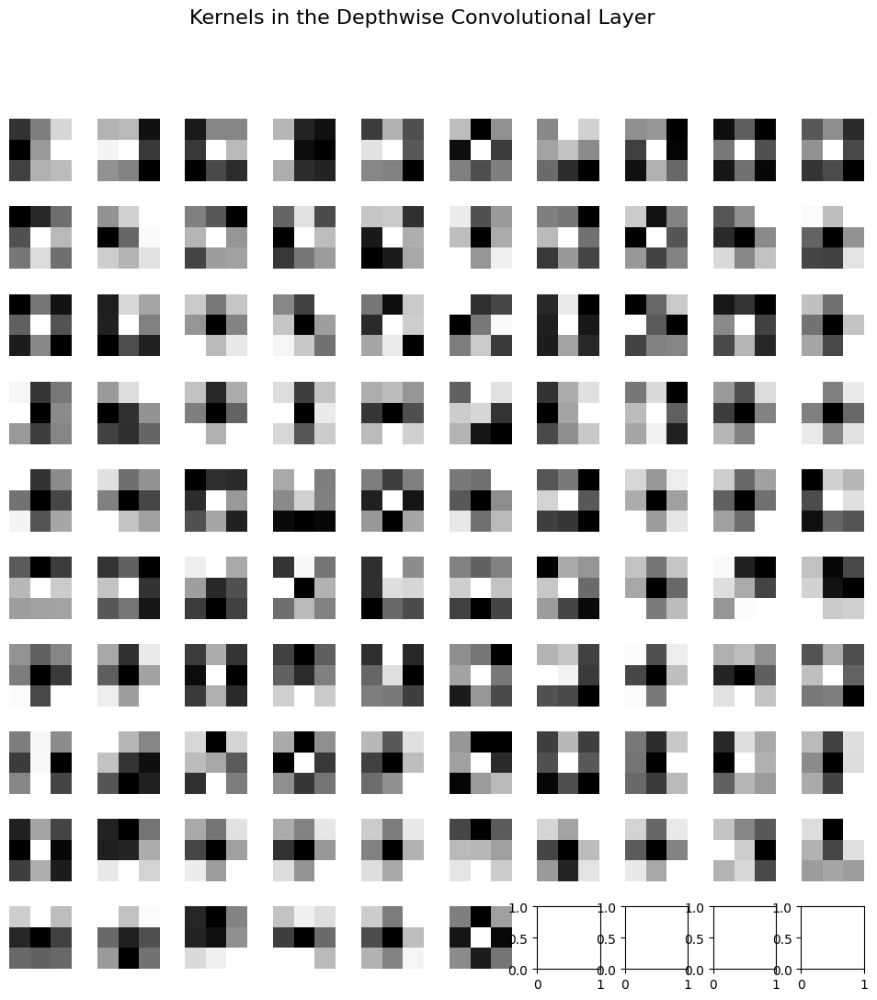

In [46]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
import numpy as np
import matplotlib.pyplot as plt

# Load the MobileNetV2 model
model = MobileNetV2(include_top=False, weights='imagenet')

# Get the depthwise convolutional layer
depthwise_conv_layer = model.get_layer('block_1_depthwise')

# Get the kernel weights
kernel_weights = depthwise_conv_layer.get_weights()[0]

# Plot the kernels
num_kernels = kernel_weights.shape[2]
num_rows = num_cols = int(np.ceil(np.sqrt(num_kernels)))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 12))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(num_rows):
    for j in range(num_cols):
        if i * num_cols + j < num_kernels:
            kernel = kernel_weights[:, :, i * num_cols + j]
            axs[i, j].imshow(kernel, cmap='gray')
            axs[i, j].axis('off')

plt.suptitle('Kernels in the Depthwise Convolutional Layer', fontsize=16)
plt.show()


In [18]:
def show_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, n_cols: int=5, figsize: tuple=(25, 8), model: tf.keras.Model=None) -> None:
    """
    Plots a grid of random images and their corresponding labels, with an optional prediction from a given model.

    Args:
        images (np.ndarray): Array of images to plot.
        labels (np.ndarray): Array of labels corresponding to the images.
        n_rows (int): Number of rows in the plot grid. Default is 1.
        n_cols (int): Number of columns in the plot grid. Default is 5.
        figsize (tuple): A tuple specifying the size of the figure. Default is (25, 8).
        model (tf.keras.Model): A Keras model object used to make predictions on the images. Default is None.

    Returns:
        None
    """


    for row in range(n_rows):
        # Create a new figure for each row
        plt.figure(figsize=figsize)


        rand_indices = np.random.choice(len(images), size=n_cols, replace=False)


        for col, index in enumerate(rand_indices):
            
            image = images[index]
            label = class_names[int(labels[index])]

            
            if model:
                prediction = model.predict(np.expand_dims(tf.squeeze(image), axis=0), verbose=0)[0]
                conf = np.max(prediction, axis=-1)
                label += "\nPrediction: {} - {:.4}".format(class_names[np.argmax(prediction)], conf)

# Plot the image and label
            plt.subplot(1, n_cols, col+1)
            plt.imshow(image)
            plt.title(label.title())
            plt.axis("off")

        # Show the row of images
        plt.show()

In [19]:
plt.figure

<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>

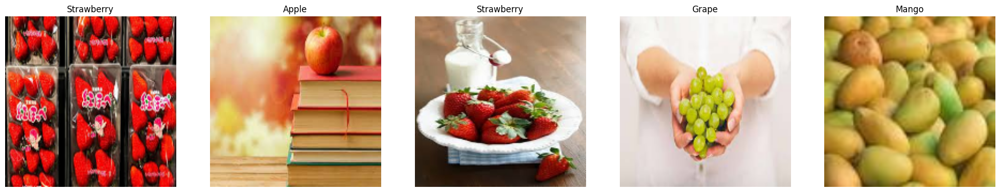

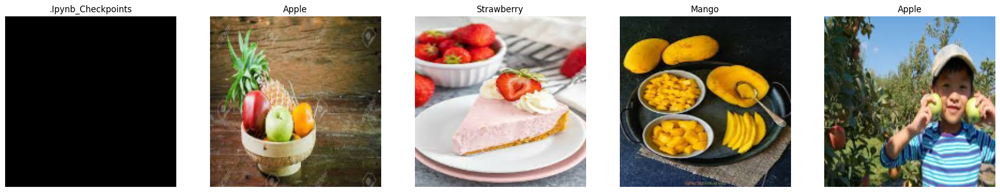

In [20]:
show_images(images=X_train, labels=y_train, n_rows=2)


In [21]:
#!pip install matplotlib
import matplotlib.pyplot as plt

import numpy as np
def show_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, n_cols: int=5, figsize: tuple=(25, 8), model: tf.keras.Model=None) -> None:
    """
    Plots a grid of random images and their corresponding labels, with an optional prediction from a given model.

    Args:
        images (np.ndarray): Array of images to plot.
        labels (np.ndarray): Array of labels corresponding to the images.
        n_rows (int): Number of rows in the plot grid. Default is 1.
        n_cols (int): Number of columns in the plot grid. Default is 5.
        figsize (tuple): A tuple specifying the size of the figure. Default is (25, 8).
        model (tf.keras.Model): A Keras model object used to make predictions on the images. Default is None.

    Returns:
        None
    """
  
 # Loop over each row of the plot
    for row in range(n_rows):
        # Create a new figure for each row
        plt.figure(figsize=figsize)

        # Generate a random index for each column in the row
        rand_indices = np.random.choice(len(images), size=n_cols, replace=False)

        # Loop over each column of the plot
        for col, index in enumerate(rand_indices):
            # Get the image and label at the random index
            image = images[index]
            label = class_names[int(labels[index])]

            # If a model is provided, make a prediction on the image
            if model:
                prediction = model.predict(np.expand_dims(tf.squeeze(image), axis=0), verbose=0)[0]
                conf = np.max(prediction, axis=-1)
                label += "\nPrediction: {} - {:.4}".format(class_names[np.argmax(prediction)], conf)

                # Plot the image and label
            plt.subplot(1, n_cols, col+1)
            plt.imshow(image)
            plt.title(label.title())
            

        # Show the row of images
        plt.show()
        plt.show()
        #plt.savefig('sample_figure.png')



In [22]:
plt.show(block=True)

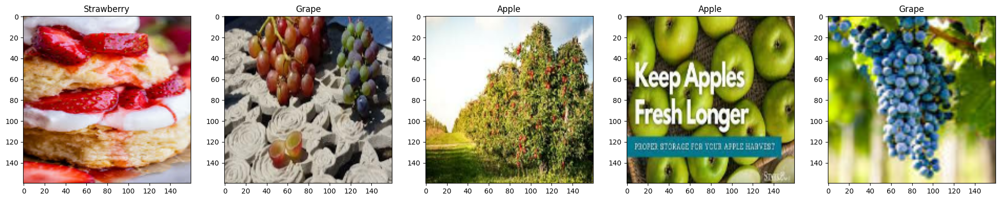

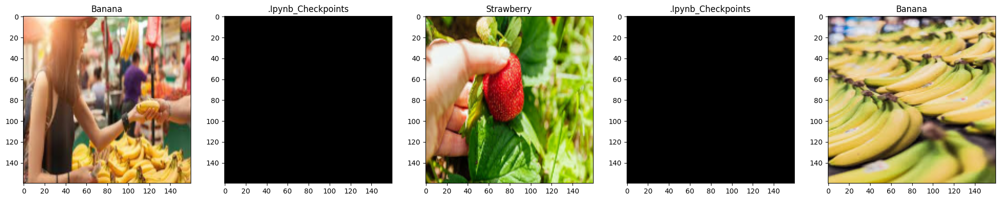

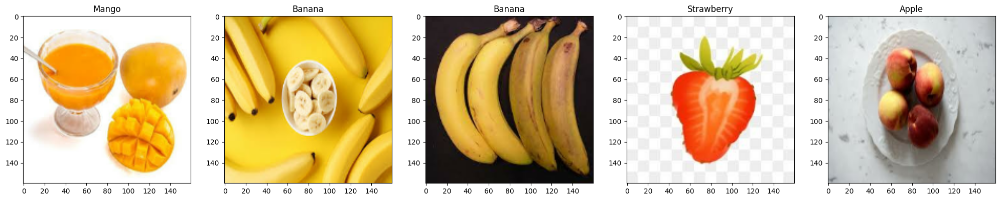

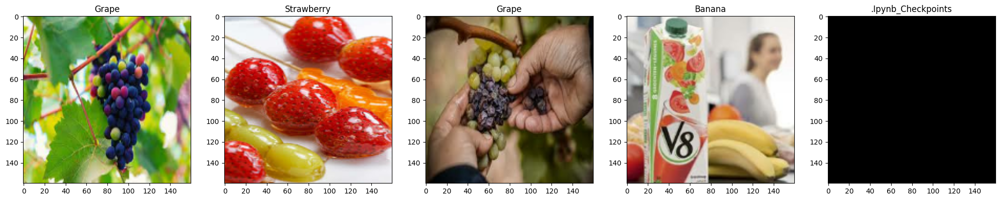

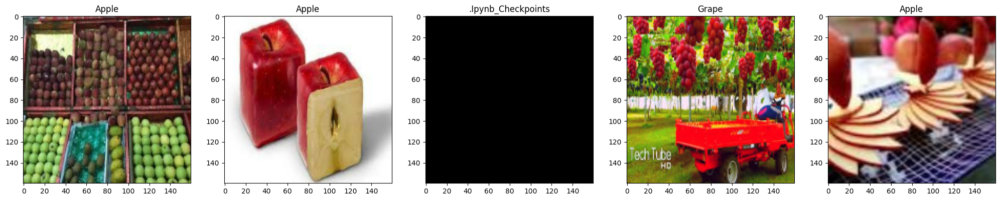

In [23]:
# Visualize Training Dataset
show_images(images=X_train, labels=y_train, n_rows=5)

In [24]:
# Mobilenet Backbone
print("Loading MobileNet Backbone: ")
mobilenet = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)

# Freeze the model weights
mobilenet.trainable = False

# The Mobilenet Model baseline
mobilenet = Sequential([
    mobilenet,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(n_classes, activation='softmax')
])

# Compile the Baseline
mobilenet.compile(
    loss=LOSS,
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=METRICS
)

# Train the Xception Baseline Model
print("\nTraining Baseline Model: ")
mobilenet.fit(
    X_train, y_train, 
    validation_data=(X_valid, y_valid), 
    epochs=50, 
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint("MobileNetV2Baseline.h5", save_best_only=True)
    ],
    batch_size=BATCH_SIZE
)

# Testing Evaluation
mobilenet_test_loss, mobilenet_test_acc = mobilenet.evaluate(X_test, y_test)
print(f"\nMobileNet Baseline Testing Loss     : {mobilenet_test_loss}.")
print(f"MobileNet Baseline Testing Accuracy : {mobilenet_test_acc}.")

Loading MobileNet Backbone: 

Training Baseline Model: 
Epoch 1/50
188/188 [==============================] - 24s 114ms/step - loss: 0.8673 - accuracy: 0.6863 - val_loss: 0.4885 - val_accuracy: 0.8050
Epoch 2/50
188/188 [==============================] - 21s 109ms/step - loss: 0.4978 - accuracy: 0.8237 - val_loss: 0.3960 - val_accuracy: 0.8400
Epoch 3/50
188/188 [==============================] - 20s 109ms/step - loss: 0.4239 - accuracy: 0.8498 - val_loss: 0.3873 - val_accuracy: 0.8400
Epoch 4/50
188/188 [==============================] - 20s 107ms/step - loss: 0.3959 - accuracy: 0.8592 - val_loss: 0.3779 - val_accuracy: 0.8350
Epoch 5/50
188/188 [==============================] - 20s 109ms/step - loss: 0.3677 - accuracy: 0.8655 - val_loss: 0.3343 - val_accuracy: 0.8650
Epoch 6/50
188/188 [==============================] - 21s 110ms/step - loss: 0.3518 - accuracy: 0.8733 - val_loss: 0.3190 - val_accuracy: 0.8950
Epoch 7/50
188/188 [==============================] - 21s 109ms/step - los

In [25]:
def build_model(hp):
    
    # Define all hyperparms
    mobilenet = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)
    mobilenet.trainable = False
    n_layers = hp.Choice('n_layers', [2, 4])
    dropout_rate = hp.Choice('rate', [0.4, 0.7])
    n_units = hp.Choice('units', [256, 512])
    learning_rate = hp.Choice('lr', [LEARNING_RATE, LEARNING_RATE * 0.1, LEARNING_RATE*0.01])
    
    # Mode architecture
    model = Sequential([
        mobilenet,
        GlobalAveragePooling2D(),
    ])
    
    # Add hidden/top layers 
    for _ in range(n_layers):
        model.add(Dense(n_units, activation='relu', kernel_initializer='he_normal'))
    
    # Add Dropout Layer
    model.add(Dropout(dropout_rate))
    
    # Output Layer
    model.add(Dense(n_classes, activation='softmax'))
    
    # Compile the model
    model.compile(
        loss=LOSS,
        optimizer = Adam(learning_rate),
        metrics = METRICS
    )
    
    # Return model
    return model

In [26]:
GridSearch = kt.GridSearch(
    hypermodel=build_model,
    objective='val_loss',
    max_trials=10,
    seed=42,
    project_name="MobileNetSearch", 
    loss=LOSS)
    # hyperparameters=None,
    # tune_new_entries=True,
    # allow_new_entries=True,
    # max_retries_per_trial=0,
    # max_consecutive_failed_trials=3,
    
    # Start Searching
search = GridSearch.search(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs = 10,
    batch_size = BATCH_SIZE
)

INFO:tensorflow:Reloading Tuner from ./MobileNetSearch/tuner0.json
INFO:tensorflow:Oracle triggered exit


In [27]:
# # Initialize Random Searcher
# random_searcher = kt.RandomSearch(
#     hypermodel=build_model, 
#     objective='val_loss', 
#     max_trials=10, 
#     seed=42, 
#     project_name="MobileNetSearch", 
#     loss=LOSS)

# # Start Searching
# search = random_searcher.search(
#     X_train, y_train,
#     validation_data=(X_valid, y_valid),
#     epochs = 10,
#     batch_size = BATCH_SIZE
# )

In [28]:
# Best Hyper params
best_hps = GridSearch.get_best_hyperparameters()[0]
print(f"Best Hyper Params founded: {best_hps.values}\n")

# Build the best model
mobile_net_model = build_model(best_hps)
mobile_net_model.summary()

# Compile the model
print("\nTraining Best Model Architecture : ")
mobile_net_model_history = mobile_net_model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[
        EarlyStopping(patience=5, restore_best_weights=True),
        ModelCheckpoint('BestMobileNet.h5', save_best_only=True)
    ]
)

Best Hyper Params founded: {'n_layers': 4, 'rate': 0.4, 'units': 256, 'lr': 0.001}

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 256)               327936    
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                    

In [ ]:
mobilenet.layers

In [ ]:
# # Best Hyper params
# best_hps = random_searcher.get_best_hyperparameters()[0]
# print(f"Best Hyper Params founded: {best_hps.values}\n")

# # Build the best model
# mobile_net_model = build_model(best_hps)
# mobile_net_model.summary()

# # Compile the model
# print("\nTraining Best Model Architecture : ")
# mobile_net_model_history = mobile_net_model.fit(
#     X_train, y_train,
#     validation_data=(X_valid, y_valid),
#     epochs=EPOCHS,
#     batch_size=BATCH_SIZE,
#     callbacks=[
#         EarlyStopping(patience=5, restore_best_weights=True),
#         ModelCheckpoint('BestMobileNet.h5', save_best_only=True)
#     ]
# )

In [32]:
test_loss, test_acc = mobile_net_model.evaluate(X_test, y_test)
print("Training Loss    : {:.4} | Baseline : {:.4}".format(test_loss, mobilenet_test_loss))
print("Training Accuracy: {:.4}% | Baseline : {:.4}%".format(test_acc*100, mobilenet_test_acc*100))

4/4 [==============================] - 0s 82ms/step - loss: 0.3664 - accuracy: 0.9000
Training Loss    : 0.3664 | Baseline : 0.3559
Training Accuracy: 90.0% | Baseline : 92.0%


In [33]:
# Make predictions
baseline_pred = np.argmax(mobilenet.predict(X_test, verbose=0), axis=-1)
best_pred = np.argmax(mobile_net_model.predict(X_test, verbose=0), axis=-1)

# Evaluate prediction : Precision
baseline_pre = precision_score(y_test, baseline_pred, average='macro')
best_pre = precision_score(y_test, best_pred, average='macro')

# Evaluate prediction : Recall
baseline_recall = recall_score(y_test, baseline_pred, average='macro')
best_recall = recall_score(y_test, best_pred, average='macro')

# Evaluate prediction : F1 Score
baseline_f1 = f1_score(y_test, baseline_pred, average='macro')
best_f1 = f1_score(y_test, best_pred, average='macro')

print("{:20} | {:20}".format("Baseline Performance", "Best Performance\n"))
print("{:10} : {:.5}  | {:.5}".format("Precision", baseline_pre, best_pre))
print("{:10} : {:.5}    | {:.5}".format("Recall", baseline_recall, best_recall))
print("{:10} : {:.5} | {:.5}".format("F1 Score", baseline_f1, best_f1))


Baseline Performance | Best Performance
   
Precision  : 0.92482  | 0.90818
Recall     : 0.92    | 0.9
F1 Score   : 0.92006 | 0.90199


In [34]:
print(classification_report(y_test, baseline_pred))

              precision    recall  f1-score   support

           1       0.86      0.90      0.88        20
           2       0.87      1.00      0.93        20
           3       0.95      0.95      0.95        20
           4       0.95      0.90      0.92        20
           5       1.00      0.85      0.92        20

    accuracy                           0.92       100
   macro avg       0.92      0.92      0.92       100
weighted avg       0.92      0.92      0.92       100



In [35]:
print(classification_report(y_test, best_pred))

              precision    recall  f1-score   support

           1       0.77      0.85      0.81        20
           2       0.95      0.95      0.95        20
           3       1.00      0.95      0.97        20
           4       0.82      0.90      0.86        20
           5       1.00      0.85      0.92        20

    accuracy                           0.90       100
   macro avg       0.91      0.90      0.90       100
weighted avg       0.91      0.90      0.90       100



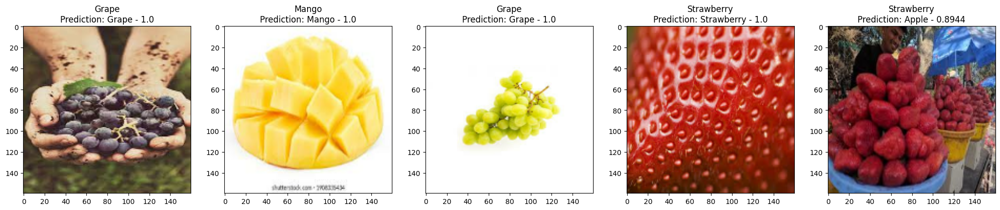

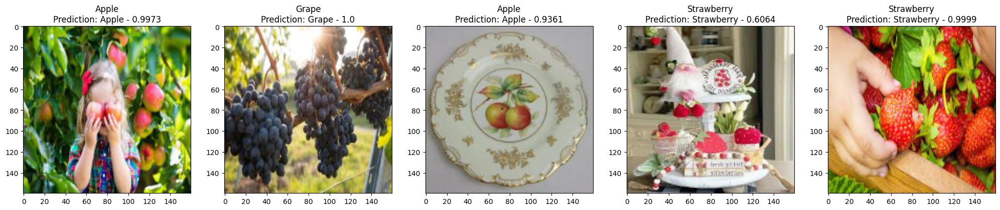

In [36]:
show_images(images=X_test, labels=y_test, model=mobile_net_model, n_rows=2)

In [37]:
# Calculate accuracy on training set
from sklearn.metrics import accuracy_score

train_predictions = np.argmax(mobile_net_model.predict(X_train, verbose=0), axis=-1)
train_accuracy = accuracy_score(y_train, train_predictions)

# Calculate accuracy on test set
test_accuracy = accuracy_score(y_test, best_pred)

print("Training Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)

Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9


Epoch: 1
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 2
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 3
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 4
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 5
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 6
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 7
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 8
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 9
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9

Epoch: 10
Training Accuracy: 0.9871666666666666
Test Accuracy: 0.9



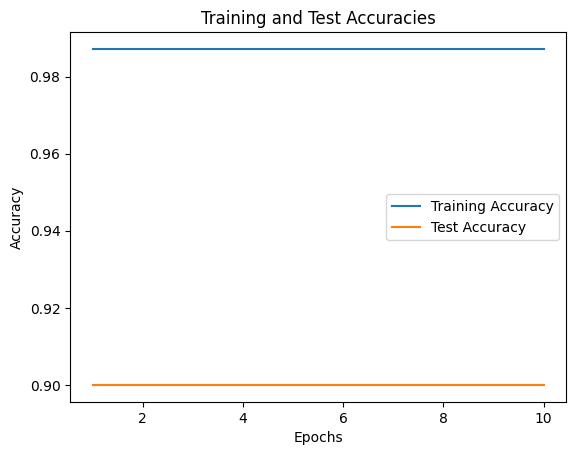

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of epochs
num_epochs = 10

# Lists to store training and test accuracies
train_accuracies = []
test_accuracies = []

# Training loop
for epoch in range(num_epochs):
    # Perform training for one epoch
    
    # Calculate training accuracy
    train_predictions = np.argmax(mobile_net_model.predict(X_train, verbose=0), axis=-1)
    train_accuracy = accuracy_score(y_train, train_predictions)
    train_accuracies.append(train_accuracy)
    
    # Calculate test accuracy
    test_predictions = np.argmax(mobile_net_model.predict(X_test, verbose=0), axis=-1)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_accuracies.append(test_accuracy)
    
    # Print epoch and accuracies
    print("Epoch:", epoch+1)
    print("Training Accuracy:", train_accuracy)
    print("Test Accuracy:", test_accuracy)
    print()
    
# Plot the training and test accuracies
epochs = range(1, num_epochs+1)
plt.plot(epochs, train_accuracies, label='Training Accuracy')
plt.plot(epochs, test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracies')
plt.legend()
plt.show()
